# Abstract

#### Metas: Lo que me llevó a la elección de un dataset que trate sobre videojuegos se debe a primera instancia a mi interés hacia los mismos. Al ser un apasionado, trabajar con datos relacionados con ellos hizo que pudiera combinar mi interés personal con mi trabajo, lo que hizo que el proceso sea mucho más ameno y disfrutable. Otro punto es la variedad, ya que el dataset cuenta con una gran cantidad de datos, que van desde información sobre los jugadores, hasta año de lanzamiento, plataforma, entre otros. Esto me proporciono una amplia gama de posibilidades para el análisis y extracción de información útil. Además, como la industria de los videojuegos está en constante crecimiento y es una de las más grandes del mundo del entretenimiento, trabajar con datos de videojuegos me proporciono una perspectiva única sobre esta industria en evolución.


#### Para quien está dirigido: Este proyecto fue planeado para una amplia gama de audiencias, tanto como para aquellos individuos que deseen explorar y realizar conclusiones para proyectos futuros, como a empresas interesadas en comprender en profundidad como se lleva a cabo un proyecto de Ciencia de Datos.

#### Contexto comercial: La industria de los videojuegos se destaca por su alta competitividad y constante evolución, donde la búsqueda de contenido innovador y experiencias de usuario mejoradas es una prioridad. Las tendencias actuales, como el crecimiento de los juegos móviles, la realidad virtual y el modelo de negocio de los juegos como servicio están redefiniendo continuamente el panorama de esta industria en constante cambio.

#### Problema comercial: Una empresa de desarrollo de videojuegos está enfrentando numerosos desafíos debido a que desarrolladoras rivales están tomando ventaja mediante decisiones acertadas. Se nos ha contratado en un equipo como Data Scientist para crear uno o más algoritmos de machine learning que le permita a la desarrolladora tener una ventaja contra la competencia. Entre los principales objetivos se busca mejorar la planificación de lanzamientos, mejorar la evaluación de inversores, optimizar las estrategias de marketing y la gestión de inventario.


#### Definición del objetivo: Se aplicará un algoritmo que pueda predecir las ventas globales de un juego basado en diferentes características, ya que sería una herramienta valiosa en la toma de decisiones estratégicas dentro de esta industria, ayudando a mejorar la eficiencia y el rendimiento comercial. También un algoritmo que identificara grupos de videojuegos con ventas similares, lo que le permitiría a la empresa comprender mejor el comportamiento del mercado global, mejorando la adaptación de estrategias de marketing y desarrollo de juegos.

# Diccionario
#### Name: Nombre del videojuego
#### Platform: Plataforma
#### Year_of_Release: Año de lanzamiento del juego
#### Genre: Género
#### Publisher: Editora
#### NA_Sales: Ventas en Norte América
#### EU_Sales: Ventas en Europa
#### JP_Sales: Ventas en Japon
#### Other_Sales: Ventas en otros lugares
#### Global_Sales: Ventas globales
#### Critic_Score: Puntuación de los críticos
#### Critic_Count: Cantidad de críticos
#### User_Score: Puntuación del usuario
#### User_Count: Cantidad de usuarios
#### Developer: Desarrolladora
#### Rating: Clasificación por edad

# Análisis primario del dataset

In [1]:
# Importo librerias

import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
# Importo Dataset

df_juegos = pd.read_excel(r'C:\Users\Dario\Desktop\Data Science\Primera entrega Dario Cancelli\Video_Games.xlsx')
df_juegos.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,4136,2896,377,845,8253,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,2908,358,681,77,4024,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,1568,1276,379,329,3552,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,1561,1093,328,295,3277,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,1127,889,1022,1,3137,NaN,NaN,NaN,NaN,NaN,NaN


#### Contexto analítico: El dataset cuenta con muchas variables de interés, las cuales serán analizadas. Viendo las columnas en primera instancia llegué a la conclusión de cinco posibles análisis:
#### 1- Análisis de venta por región: Analizando las ventas de los videojuegos en diferentes regiones podría identificar patrones de consumo y preferencias de mercado en las diferentes regiones geográficas.
#### 2- Análisis de géneros: Se podría investigar la popularidad de diferentes géneros de videojuegos y como varían a lo largo del tiempo y en diferentes regiones.
#### 3- Evolución temporal de las ventas: Se podría observar cómo han cambiado las ventas de videojuegos a lo largo de los años para identificar tendencias a largo plazo en la industria. 
#### 4- Análisis de editoriales: Examinaré las ventas de videojuegos por editoriales para identificar a los principales intérpretes en la industria y cómo se comparan en términos de ventas y éxito comercial.


# EDA

In [3]:
# informacion del dataset
df_juegos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  int64  
 6   EU_Sales         16719 non-null  int64  
 7   JP_Sales         16719 non-null  int64  
 8   Other_Sales      16719 non-null  int64  
 9   Global_Sales     16719 non-null  int64  
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(4), int64(5), object(7)
memory usage: 2.0+ MB


In [4]:
# Dimencionalidad del dataset
df_juegos.shape

(16719, 16)

In [5]:
# Correlaciones 
df_juegos.corr()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count
Year_of_Release,1.000000,-0.088532,0.003818,-0.157847,0.036939,-0.068535,0.011411,0.223407,0.175339
NA_Sales,-0.088532,1.000000,0.742861,0.406638,0.606073,0.879064,0.231795,0.280822,0.242222
EU_Sales,0.003818,0.742861,1.000000,0.377003,0.668854,0.837507,0.209221,0.257008,0.266285
JP_Sales,-0.157847,0.406638,0.377003,1.000000,0.231207,0.557986,0.149058,0.169476,0.075597
Other_Sales,0.036939,0.606073,0.668854,0.231207,1.000000,0.690934,0.183295,0.236844,0.224305
Global_Sales,-0.068535,0.879064,0.837507,0.557986,0.690934,1.000000,0.232433,0.284319,0.260698
Critic_Score,0.011411,0.231795,0.209221,0.149058,0.183295,0.232433,1.000000,0.425504,0.264376
Critic_Count,0.223407,0.280822,0.257008,0.169476,0.236844,0.284319,0.425504,1.000000,0.362334
User_Count,0.175339,0.242222,0.266285,0.075597,0.224305,0.260698,0.264376,0.362334,1.000000


In [6]:
# Vemos la distribucion del dataset
df_juegos.describe(include = 'all')

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
count,16717,16719,16450.000000,16717,16665,16719.000000,16719.000000,16719.000000,16719.000000,16719.000000,8137.000000,8137.000000,10015,7590.000000,10096,9950
unique,11562,31,NaN,12,581,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96,NaN,1696,8
top,Need for Speed: Most Wanted,PS2,NaN,Action,Electronic Arts,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tbd,NaN,Ubisoft,E
freq,12,2161,NaN,3370,1356,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2425,NaN,204,3991
mean,NaN,NaN,2006.487356,NaN,NaN,23.885340,13.324122,6.968359,4.416652,48.534781,68.967679,26.360821,NaN,162.229908,NaN,NaN
std,NaN,NaN,5.878995,NaN,NaN,76.625403,48.935129,28.610609,18.331245,147.946367,13.938165,18.980495,NaN,561.282326,NaN,NaN
min,NaN,NaN,1980.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,13.000000,3.000000,NaN,4.000000,NaN,NaN
25%,NaN,NaN,2003.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,5.000000,60.000000,12.000000,NaN,10.000000,NaN,NaN
50%,NaN,NaN,2007.000000,NaN,NaN,6.000000,2.000000,0.000000,1.000000,14.000000,71.000000,21.000000,NaN,24.000000,NaN,NaN
75%,NaN,NaN,2010.000000,NaN,NaN,21.000000,9.000000,3.000000,3.000000,42.000000,79.000000,36.000000,NaN,81.000000,NaN,NaN


In [7]:
# Duplicados
df_juegos.duplicated().sum()

0

In [8]:
# Conteo de nulos
df_juegos.isnull().sum()


Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8582
Critic_Count       8582
User_Score         6704
User_Count         9129
Developer          6623
Rating             6769
dtype: int64

#### A simple vista puedo identificar que el dataset no cuenta con una distribución normal, este contiene muchos datos nulos y también outliers

####  Para hacer un análisis mas profundo y entender mejor el dataset voy a utilizar la librería pandas profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

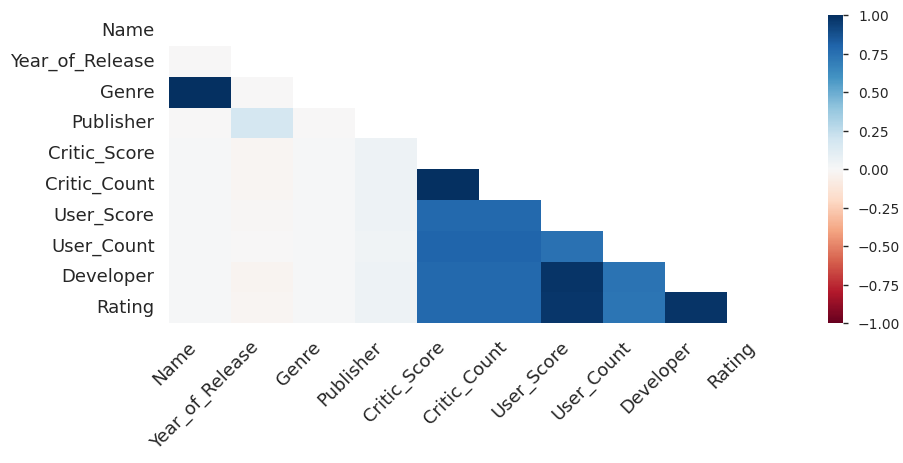

In [9]:
import pandas as pd
from pandas_profiling import ProfileReport

# Perfil
perfil = ProfileReport(df_juegos, title="Reporte de Juegos")

# Lo guardo en formato HTML
perfil.to_file("reporte_juegos.html")

# Visualizacion 
perfil.to_notebook_iframe()

### Insights: 
#### Nulos: Desde la columna critic score hasta la columna rating hay demasiados datos nulos, por lo cual no podemos utilizar medidas de tendencia central para rellenar esas columnas, debido a que generaríamos mucho ruido en el dataset, por eso eliminare esas columnas y trabajare con las demás.  Además, observando la matriz, es difícil diferenciar si los datos faltan en las mismas columnas.
#### Correlaciones: Parece ser que todas las ventas tienen una correlación alta entre sí, por lo cual cuando haya que graficar u entrenar un modelo hay que elegir una columna representativa, de todas formas, mas adelante se vera de una forma mas detallada.


# Data Wrangling

In [10]:
# creo otro dataset para hacer las conversiones

df_juegos2 = df_juegos[['Name','Platform','Year_of_Release','Genre','Publisher','NA_Sales','EU_Sales','JP_Sales','Other_Sales','Global_Sales']]

In [11]:
# Relleno de nulos

# Mediana
mediana = df_juegos2.select_dtypes(include=['float64', 'int64']).median()

# Relleno 
df_juegos2.fillna(mediana, inplace=True)

# Moda
moda = df_juegos2.select_dtypes(include=['object']).mode().iloc[0]

# Relleno
df_juegos2.fillna(moda, inplace=True)

df_juegos2.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,Wii Sports,Wii,2006.0,Sports,Nintendo,4136,2896,377,845,8253
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,2908,358,681,77,4024
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,1568,1276,379,329,3552
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,1561,1093,328,295,3277
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,1127,889,1022,1,3137


#### Con el nuevo dataset exploraré los datos mediante gráficos para comprender mejor la naturaleza de los mismos y concretar los análisis planteados. 

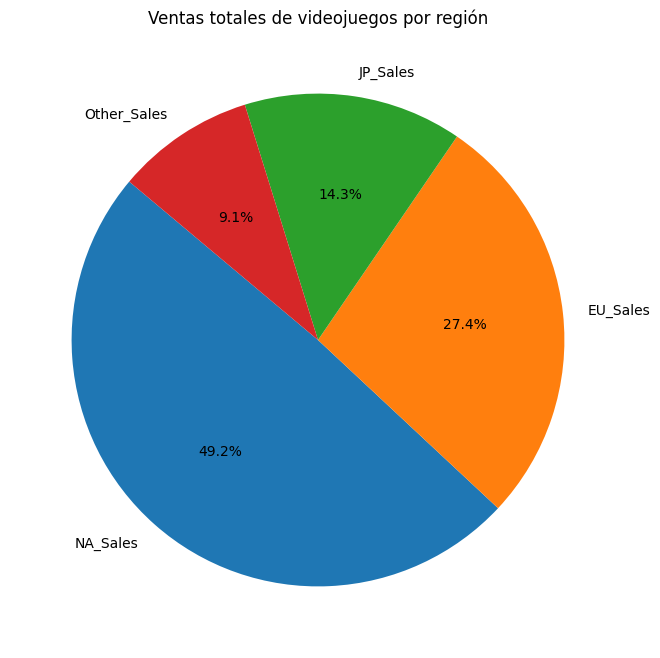

In [12]:
import matplotlib
import matplotlib.pyplot as plt
matplotlib.__version__
# Ventas totales por región
ventas_totales = df_juegos2[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].sum()

# Gráfico de torta
plt.figure(figsize=(8, 8))
plt.pie(ventas_totales.values, labels=ventas_totales.index, autopct='%1.1f%%', startangle=140)

# Agregar título
plt.title('Ventas totales de videojuegos por región')

# Mostrar el gráfico
plt.show()

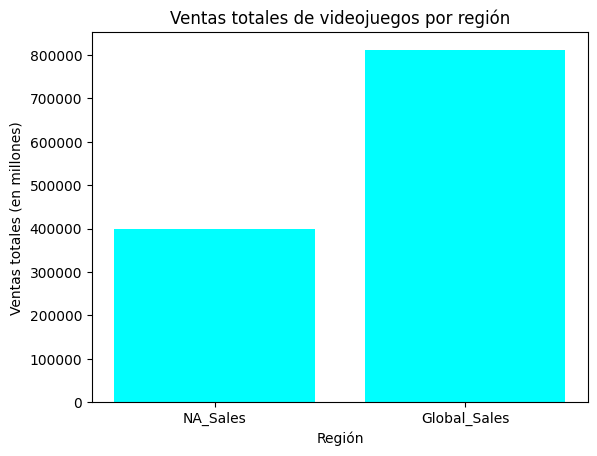

In [13]:
# Comparacion entre Global_Sales y Na_Sales

ventas_totales = df_juegos2[['NA_Sales', 'Global_Sales']].sum()

# Crear el gráfico de barras

plt.bar(ventas_totales.index, ventas_totales.values, color='cyan')
plt.title('Ventas totales de videojuegos por región')
plt.xlabel('Región')
plt.ylabel('Ventas totales (en millones)')
plt.show()

#### Las ventas en Norte América son las más grandes a nivel regional y son el 50% de las ventas a nivel mundial. Esto puede deberse a diversos factores, como por ejemplo el tamaño del mercado, la industria desarrollada de los videojuegos y la cultura que existe de los mismos en el país, tambien hay que tener en cuenta las tendencias del mercado y las estrategias de marketing especificas que se utilizan en esta región.

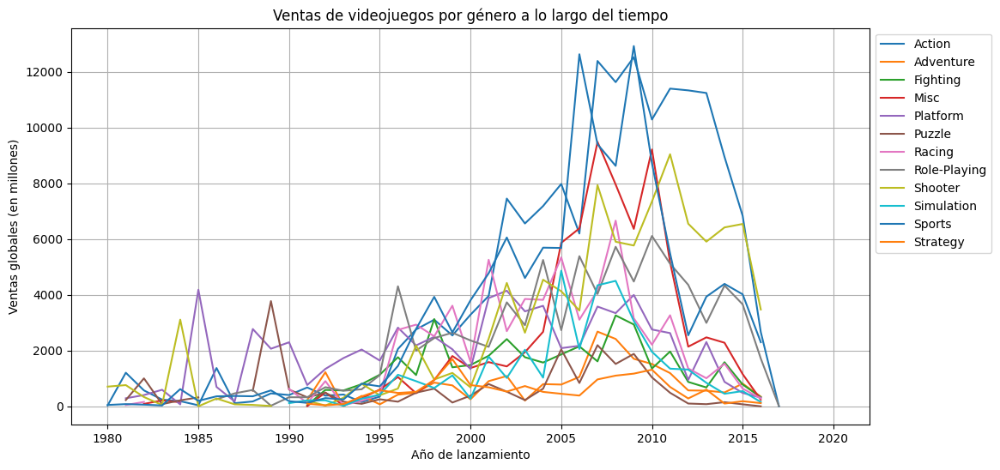

In [14]:
# Agrupo por año de lanzamiento, genero y ventas totales 

ventas_genero_año = df_juegos2.groupby(['Year_of_Release', 'Genre'])[['Global_Sales']].sum().reset_index()

# Hago un pivot al dataframe
ventas_genero_año_pivot = ventas_genero_año.pivot(index='Year_of_Release', columns='Genre', values='Global_Sales')

# Gráfico de lineas

plt.figure(figsize=(12, 6))
for columna in ventas_genero_año_pivot.columns:
    plt.plot(ventas_genero_año_pivot.index, ventas_genero_año_pivot[columna], label=columna)

# Agregar título y etiquetas a los ejes

plt.title('Ventas de videojuegos por género a lo largo del tiempo')
plt.xlabel('Año de lanzamiento')
plt.ylabel('Ventas globales (en millones)')

# Mostrar la leyenda y el gráfico

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

#### Se observa que a medida que pasan los años algunos géneros de videojuegos experimentaron picos de popularidad, tambien parece ser que algunos géneros tienden a tener un comportamiento cíclico, suben sus ventas y luego bajan y se repite. Por ultimo los picos de popularidad pueden deberse a el lanzamiento de una nueva consola o a la popularidad generada por el marketing y los medios de comunicación.

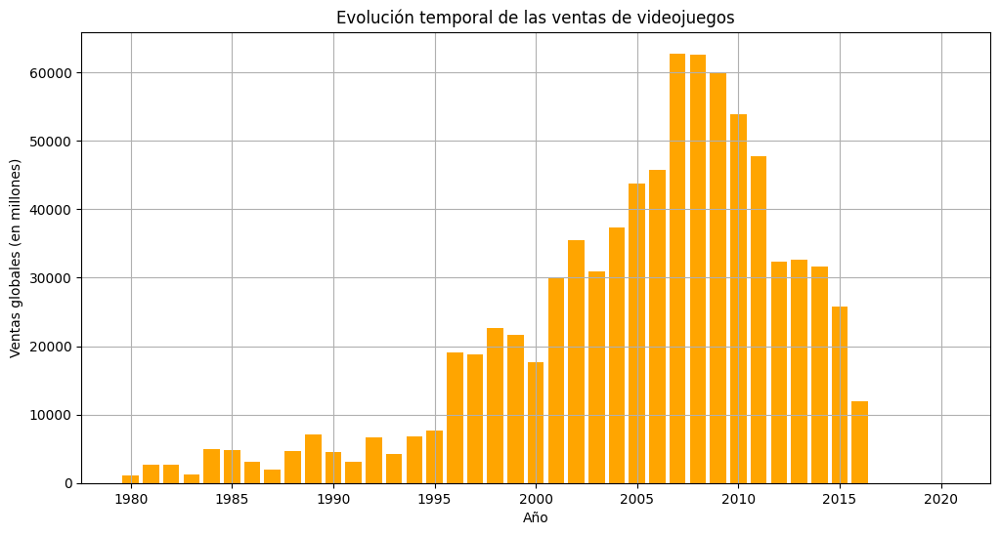

In [15]:

# Agrupo los datos por año de lanzamiento y calculo las ventas totales por año
ventas_por_año = df_juegos2.groupby('Year_of_Release')['Global_Sales'].sum()

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(ventas_por_año.index, ventas_por_año.values, color='orange')

# Agregar título y etiquetas a los ejes
plt.title('Evolución temporal de las ventas de videojuegos')
plt.xlabel('Año')
plt.ylabel('Ventas globales (en millones)')

# Mostrar el gráfico
plt.grid(True)
plt.show()

#### El declive de las ventas a lo largo del tiempo en el gráfico puede deberse en gran medida a que el dataset no cuenta con los datos necesarios para el análisis a partir del año 2016 aproximadamente. Siguiendo con el análisis, podemos observar que los años en los que se lanzan nuevas consolas o se introducen avances tecnológicos importantes pueden estar asociados con picos en las ventas de videojuegos, además es posible que los acuerdos de exclusividad con determinadas plataformas o títulos exclusivos pueden tener un impacto significativo en las ventas de videojuegos en ciertos años, lo que puede generar un mayor interés por parte de los consumidores.

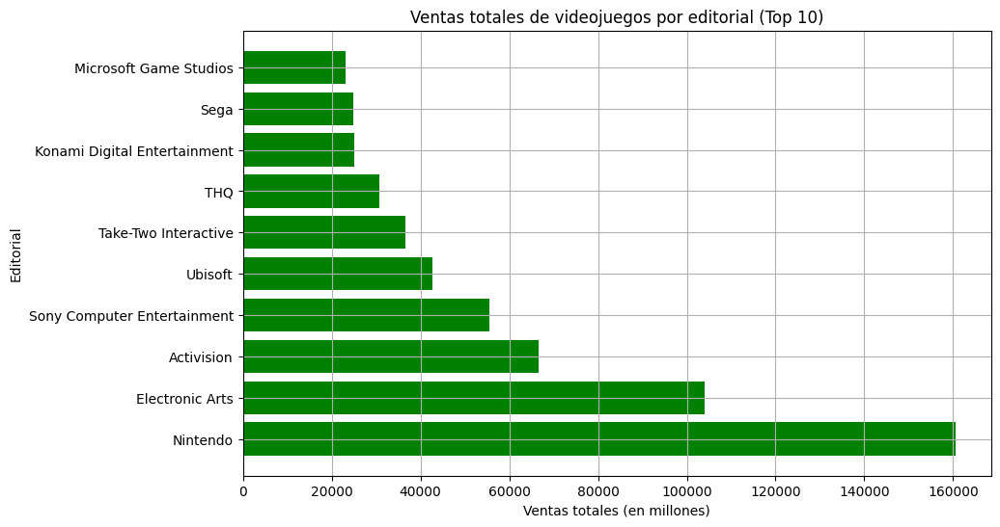

In [16]:
# Calcular las ventas totales por editorial
ventas_por_editorial = df_juegos2.groupby('Publisher')['Global_Sales'].sum().sort_values(ascending=False).head(10)

# Crear el gráfico de barras horizontales
plt.figure(figsize=(10, 6))
plt.barh(ventas_por_editorial.index, ventas_por_editorial.values, color='green')

# Agregar título y etiquetas a los ejes
plt.title('Ventas totales de videojuegos por editorial (Top 10)')
plt.xlabel('Ventas totales (en millones)')
plt.ylabel('Editorial')

# Mostrar el gráfico
plt.grid(True)
plt.show()

####  Realizando este top 10 concluí que un pequeño grupo de editoriales concentra la mayor parte de las ventas totales de videojuegos. Esto sugiere que algunas empresas tienen una posición dominante en la industria y ejercen una influencia significativa sobre el mercado, estas suelen ser aquellas con larga trayectoria en el mercado, lo que podría indicar que la reputación y el prestigio sugiere éxito comercial.

#### A continuación analizaré cada variable de mi dataset por separado para tener un mayor entendimiento de cada una

In [17]:
from pandas.api.types import is_numeric_dtype

def univariado_info(df):
    'Calculo de información de cada columna de mi dataset'
    
    # Creo un dataframe para almacenar la información
    df_info = pd.DataFrame(columns=['Cantidad', 'Tipo', 'Missing', 'Unicos', 'Numeric'])

    # Loop sobre todas las variables del DataFrame
    for col in df.columns:

        # Obtengo la serie de datos de la columna
        data_series = df[col]

        # Lleno el DataFrame con la información de las columnas 
        df_info.loc[col] = [data_series.count(), data_series.dtype, data_series.isnull().sum(), data_series.nunique(), is_numeric_dtype(data_series)]

    # Calculo la descripción estadística
    df_describe = df.describe(include='all').T[['top', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]

    # Calculao sesgo y curtosis
    df_stats = pd.DataFrame([df.skew(), df.kurtosis()], index=['sesgo', 'curtosis']).T

    # Concateno la información del DataFrame y la descripción estadística
    return pd.concat([df_info, pd.concat([df_describe, df_stats], axis=1)], axis=1).fillna('-')


df_uni_stats = univariado_info(df_juegos2)
df_uni_stats

,Cantidad,Tipo,Missing,Unicos,Numeric,top,mean,std,min,25%,50%,75%,max,sesgo,curtosis
Name,16719,object,0,11562,False,Need for Speed: Most Wanted,-,-,-,-,-,-,-,-,-
Platform,16719,object,0,31,False,PS2,-,-,-,-,-,-,-,-,-
Year_of_Release,16719,float64,0,39,True,-,2006.495604,5.831862,1980.0,2003.0,2007.0,2010.0,2020.0,-0.985126,1.853688
Genre,16719,object,0,12,False,Action,-,-,-,-,-,-,-,-,-
Publisher,16719,object,0,581,False,Electronic Arts,-,-,-,-,-,-,-,-,-
NA_Sales,16719,int64,0,362,True,-,23.88534,76.625403,0.0,0.0,6.0,21.0,4136.0,20.178455,768.139275
EU_Sales,16719,int64,0,277,True,-,13.324122,48.935129,0.0,0.0,2.0,9.0,2896.0,20.038452,839.826444
JP_Sales,16719,int64,0,216,True,-,6.968359,28.610609,0.0,0.0,0.0,3.0,1022.0,11.709006,217.712938
Other_Sales,16719,int64,0,142,True,-,4.416652,18.331245,0.0,0.0,1.0,3.0,1057.0,25.838989,1136.222517
Global_Sales,16719,int64,0,565,True,-,48.534781,147.946367,1.0,5.0,14.0,42.0,8253.0,18.87345,709.900987


#### El dataset no solo no cuenta con una distribución normal, sino que se aleja mucho a una, por lo cual no podre forzarlo a una distribución normal. El sesgo de ninguna da como resultado 0, es decir que todas las columnas son asimétricas, además la curtosis de todas las variables es positiva(leptocúrtica)es decir que la distribución es más puntiaguda y concentrada alrededor de la media con las colas más pesadas.

#### Generaré a continuación una tabla de frecuencia para una de mis variables objetivo ´Global_Sales´ para visualizarla mejor.

In [18]:
import math

# Defino la función sturges_intervals
def sturges_intervals(data):
    k = 1 + 3.322 * math.log10(len(data))
    periodos = math.ceil(k)
    intervals = pd.interval_range(
        start=data.min(),
        end=data.max() + 1,
        periods=k,
        name="Intervalo",
        closed="left")
    inter = pd.IntervalIndex([
        pd.Interval(round(i.left, 1), round(i.right, 1), i.closed)
        for i in intervals])
    return inter, periodos

# Defino la función freq_table
def freq_table(df, col, with_cuts=True):
    data = df[col]
    if not is_numeric_dtype(data) or not with_cuts:
        freq_tab = pd.crosstab(data, columns='FreqAbs').sort_values('FreqAbs', ascending=False)
    else:
        freq_tab = pd.DataFrame(index=sturges_intervals(data)[0])
        freq_tab["FreqAbs"] = pd.cut(data, bins=freq_tab.index).value_counts()
        freq_tab["Marca"] = freq_tab.index.mid
        freq_tab["LimInf"] = freq_tab.index.left
        freq_tab["LimSup"] = freq_tab.index.right
    freq_tab['FreqRel'] = freq_tab['FreqAbs'] / freq_tab['FreqAbs'].sum()
    freq_tab[['FAbsAcumulada', 'FAbsRelativa']] = freq_tab[['FreqAbs', 'FreqRel']].cumsum()
    return freq_tab

# Llamo a la función con el Dataset
freq_tab = freq_table(df_juegos2, 'Global_Sales', with_cuts=True)
freq_tab

,FreqAbs,Marca,LimInf,LimSup,FreqRel,FAbsAcumulada,FAbsRelativa
"[1.0, 551.2)",16575,276.1,1.0,551.2,0.991387,16575,0.991387
"[551.2, 1101.4)",98,826.3,551.2,1101.4,0.005862,16673,0.997249
"[1101.4, 1651.6)",26,1376.5,1101.4,1651.6,0.001555,16699,0.998804
"[1651.6, 2201.8)",9,1926.7,1651.6,2201.8,0.000538,16708,0.999342
"[2201.8, 2752.0)",2,2476.9,2201.8,2752.0,0.000120,16710,0.999462
"[2752.0, 3302.2)",6,3027.1,2752.0,3302.2,0.000359,16716,0.999821
"[3302.2, 3852.4)",1,3577.3,3302.2,3852.4,0.000060,16717,0.999880
"[3852.4, 4402.6)",1,4127.5,3852.4,4402.6,0.000060,16718,0.999940
"[4402.6, 4952.8)",0,4677.7,4402.6,4952.8,0.000000,16718,0.999940
"[4952.8, 5503.0)",0,5227.9,4952.8,5503.0,0.000000,16718,0.999940


#### La tabla de frecuencias creada proporciona la frecuencia absoluta, que indica cuántas veces aparece ese intervalo en el conjunto de datos original, la marca que proporciona una representación de la ubicación central de cada intervalo de clase en la distribución de la variable, los limites superiores e inferiores que indican los límites de cada intervalo de clase definiendo  los extremos de cada intervalo y siendo cruciales  para delimitar los rangos de valores que se agrupan juntos en cada intervalo, la frecuencia relativa indica la proporción de observaciones que caen dentro de cada intervalo de clase en relación con el total de observaciones en el conjunto de datos, y por ultimo Las columnas frecuencia absoluta acumulada  y frecuencia absoluta relativa acumulada en la tabla de frecuencias proporcionan información sobre la acumulación de frecuencias absolutas  a medida que avanzas a través de los intervalos de clase.

#### La mayoría de juegos tienen ventas globales en el intervalo [1.0, 551.2) y a medida que aumenta los intervalos de ventas, el número de juegos disminuye, de hecho, los intervalos de ventas más altos tienen una cantidad mucho mayor de juegos en comparación a los demás intervalos. Se puede observar un patrón donde la mayoría de los juegos tienen ventas globales relativamente bajas, con solo unos pocos juegos que tienen ventas globales más altas. Por último, hay algunos intervalos de ventas donde hay muy pocos juegos o incluso ninguno, lo que podría considerarse como valores atípicos en el conjunto de datos.

#### Realizaré un histograma con un gráfico de densidad para visualizar la distribución de las ventas globales. 

[Text(0.5, 1.0, 'Histograma con gráfico de densidad para todas las ventas globales')]

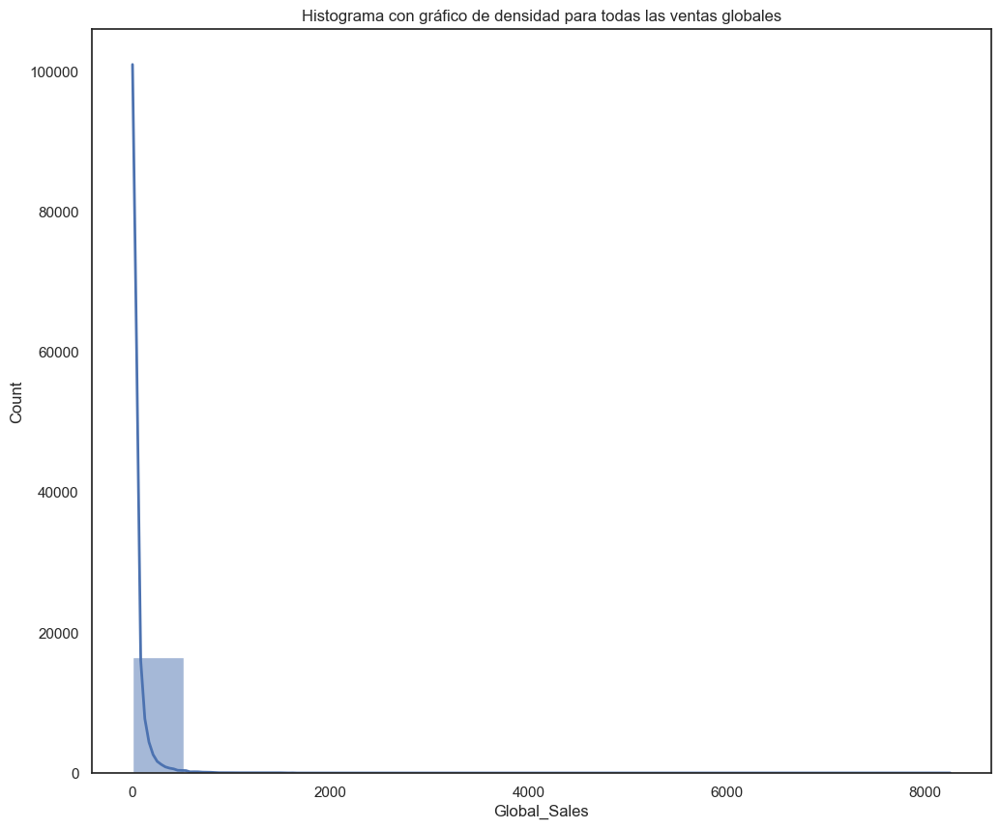

In [19]:
# Estilo del gráfico
sns.set(style="white", rc={"lines.linewidth": 2})

# Creo la figura y los ejes del gráfico
fig, axes = plt.subplots(figsize=(12,10))

# Creao el histograma con gráfico de densidad para todas las ventas globales
sns.histplot(x='Global_Sales',
             data=df_juegos2,    
             ax=axes,
             bins=sturges_intervals(df_juegos2['Global_Sales'])[1],  # Número de bins usando la regla de Sturges
             kde=True).set(title='Histograma con gráfico de densidad para todas las ventas globales')

#### El histograma presenta solo una barra, lo que podría indicar que la gran mayoría de los datos tienen el mismo valor de ventas globales. Esto podría deberse a la presencia de juegos extremadamente populares que dominan el mercado y eclipsan las ventas de otros juegos. Si todas las ventas se agrupan en un solo valor o en un rango muy estrecho, podría sugerir una falta de diversidad en los datos. Esto podría ser preocupante desde el punto de vista del análisis de mercado, ya que sugiere que el mercado está dominado por un número limitado de juegos con ventas similares.

#### Generaré un gráfico que me permita visualizar la distribución de los años de lanzamiento de los juegos para ayudarme a identificar patrones.





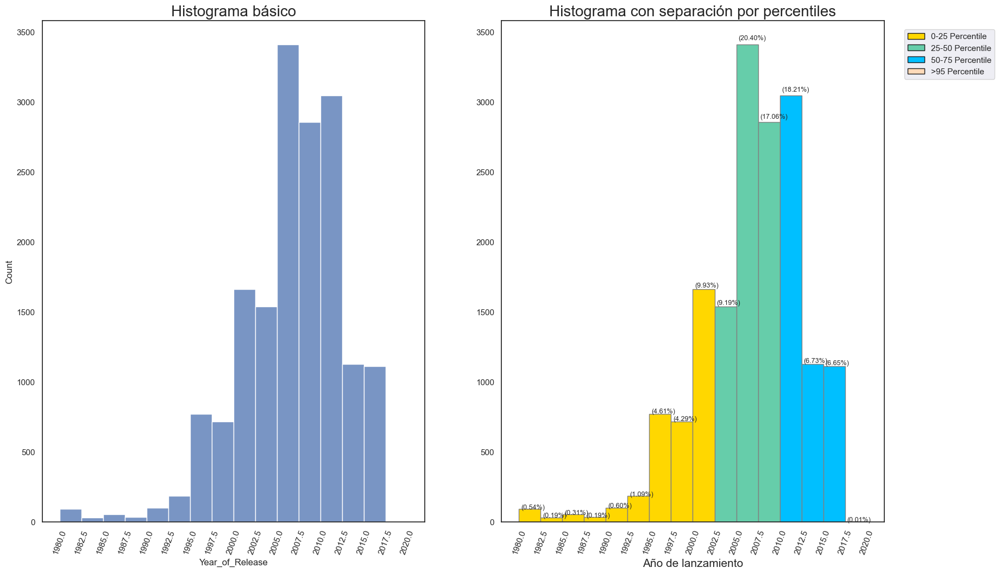

In [20]:
from matplotlib.patches import Rectangle

# Creo la figura y los ejes del gráfico
fig , axes = plt.subplots(nrows=1, ncols=2, sharex=True, figsize=(20,12))

# Gráfico básico
sns.set_theme(rc={"font.size":9,"axes.titlesize":20,"axes.labelsize":15})
sns.histplot(data=df_juegos2, x='Year_of_Release', ax=axes[0], bins='sturges').set(title='Histograma básico')
axes[0].tick_params(axis='x', rotation=70)

# Extracción de la variable
data = df_juegos2['Year_of_Release']

# Cambio de colores por percentil
perc_25_colour = 'gold'
perc_50_colour = 'mediumaquamarine'
perc_75_colour = 'deepskyblue'
perc_95_colour = 'peachpuff'

# Genero el gráfico con Sturges
counts, bins, patches = axes[1].hist(data, facecolor=perc_50_colour, edgecolor='gray', bins='sturges')

# Seteo de la variable x en su anotación
axes[1].set_xticks(bins.round(2))
plt.xticks(rotation=70)

# Genero el título y nombre de eje
plt.title('Histograma con separación por percentiles', fontsize=20)
plt.xlabel('Año de lanzamiento', fontsize=15)

# Calculo los percentiles
q25, q75, q95 = np.percentile(data, [25, 75, 95])

# Asignación de colores según barra y los valores de los percentiles
for patch, leftside, rightside in zip(patches, bins[:-1], bins[1:]):
    if rightside <= q25:
        patch.set_facecolor(perc_25_colour)
    elif leftside > q95:
        patch.set_facecolor(perc_95_colour)
    elif leftside >= q75:
        patch.set_facecolor(perc_75_colour)

# Ubicación central de los ejes de las barras x
bin_x_centers = 0.5 * np.diff(bins) + bins[:-1]

# Display de las anotaciones de cada barra en porcentaje
for i in range(len(bins)-1):
    bin_label = "({0:,.2f}%)".format((counts[i]/counts.sum())*100)
    plt.text(bin_x_centers[i]- 1, counts[i]*1.01, bin_label, rotation_mode='anchor')

# Leyenda
handles = [Rectangle((0,0),1,1,color=c,ec="k") for c in [perc_25_colour, perc_50_colour, perc_75_colour, perc_95_colour]]
labels= ["0-25 Percentile","25-50 Percentile", "50-75 Percentile", ">95 Percentile"]
plt.legend(handles, labels, bbox_to_anchor=(0.5, 0., 0.80, 0.99))


####  Los dos gráficos muestran la distribución de los años de lanzamiento de los juegos, además, el segundo divide en percentiles el histograma lo que permite concluir que entre el percentil 25-50 y 50-75 se encuentran los mayores picos de lanzamientos y la mayor conglomeración de datos. El gráfico es muy útil ya que, al tener outliers y estos encontrarse en las puntas del histograma podría recortar estas y de esa forma darle tratamiento a los outliers.

#### Creo un gráfico de Pareto para las plataformas

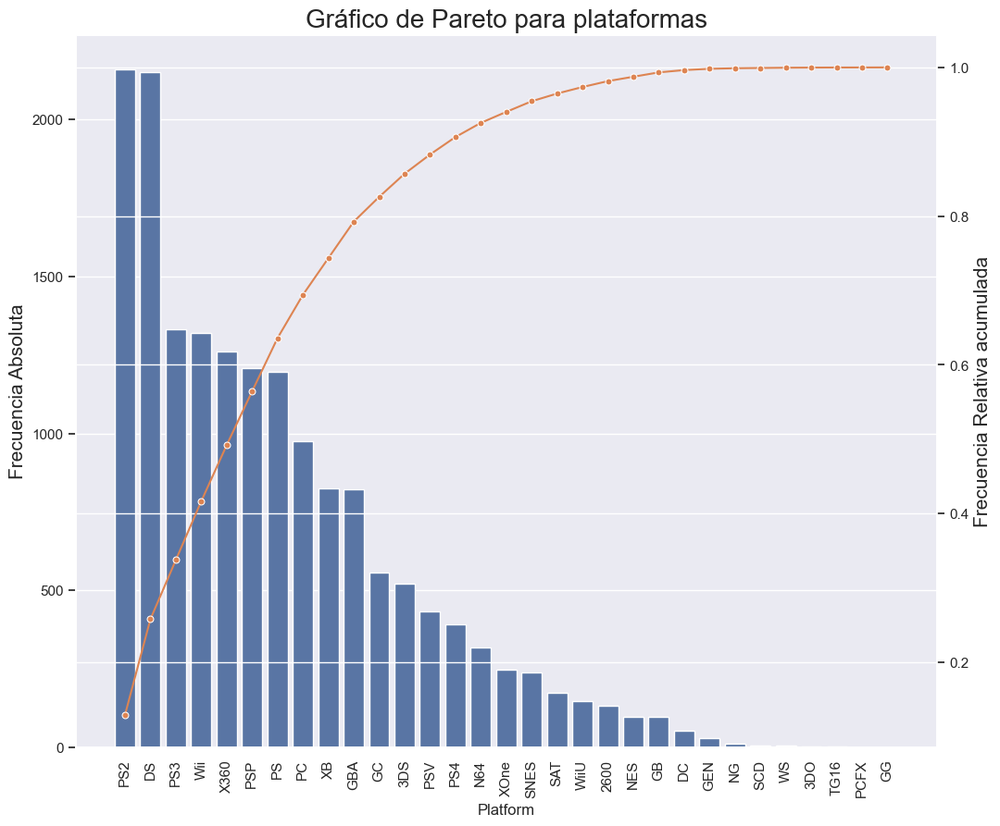

In [21]:
# Establecer el estilo de los gráficos
sns.set()

# Creo la figura y los ejes
fig, axes = plt.subplots(figsize=(12, 10))

# Calculo la tabla de frecuencias para la columna Platform
plataformas = freq_table(df_juegos2, 'Platform', with_cuts=False).reset_index().sort_values('FreqAbs', ascending=False)

# Grafico el gráfico de barras para la frecuencia absoluta de las plataformas
sns.barplot(data=plataformas, x='Platform', y='FreqAbs', ax=axes, color="C0")

# Creo un segundo eje y para la frecuencia relativa acumulada 
ax2 = axes.twinx()
sns.lineplot(data=plataformas, x='Platform', y="FAbsRelativa", color="C1", marker="o", ms=5, ax=ax2)

#Títulos y etiquetas
axes.set_title('Gráfico de Pareto para plataformas', fontsize=20)
axes.set_ylabel('Frecuencia Absoluta', fontsize=15)
ax2.set_ylabel('Frecuencia Relativa acumulada', fontsize=15)
axes.tick_params(axis='x', rotation=90)

#Gráfico
plt.show()
sns.set()

#### Realizaré un encodeo para seguir tratando mis variables

In [22]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Codifico categóricas
df_juegos2['Name'] = label_encoder.fit_transform(df_juegos2['Name'])
df_juegos2['Platform'] = label_encoder.fit_transform(df_juegos2['Platform'])
df_juegos2['Genre'] = label_encoder.fit_transform(df_juegos2['Genre'])
df_juegos2['Publisher'] = label_encoder.fit_transform(df_juegos2['Publisher'])

df_juegos2.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,11075,26,2006.0,10,361,4136,2896,377,845,8253
1,9389,11,1985.0,4,361,2908,358,681,77,4024
2,5613,26,2008.0,6,361,1568,1276,379,329,3552
3,11077,26,2009.0,10,361,1561,1093,328,295,3277
4,7392,5,1996.0,7,361,1127,889,1022,1,3137


#### Tratamiento de outliers mediante percentiles

In [23]:
# Calcular percentiles e IQR para las columnas
Q1 = df_juegos2[['Name','Platform','Year_of_Release','Genre','Publisher','NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']].quantile(0.25)
Q3 = df_juegos2[['Name','Platform','Year_of_Release','Genre','Publisher','NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']].quantile(0.75)
IQR = Q3 - Q1

# Definir límites para outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identificar outliers
outliers = ((df_juegos2[['Name','Platform','Year_of_Release','Genre','Publisher','NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']] < lower_bound) | (df_juegos2[['Name','Platform','Year_of_Release','Genre','Publisher','NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']] > upper_bound)).any(axis=1)

# Tratar outliers
df_juegos3 = df_juegos2[~outliers]
df_juegos3

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
656,10225,13,1997.0,11,139,23,1,0,0,24
2066,4671,16,2004.0,3,443,0,0,1,0,1
2069,11104,28,2006.0,10,277,8,9,2,0,1
2125,2975,29,2004.0,10,139,33,6,0,4,97
2195,5435,29,2005.0,10,139,7,2,0,3,94
...,...,...,...,...,...,...,...,...,...,...
16714,8343,17,2016.0,0,503,0,0,1,0,1
16715,5160,28,2006.0,10,91,0,1,0,0,1
16716,3890,20,2016.0,1,233,0,0,1,0,1
16717,9028,6,2003.0,4,549,1,0,0,0,1


In [24]:
df_juegos3.describe()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000,11518.000000
mean,5783.762632,15.859090,2007.175378,4.785206,291.083956,8.388783,3.387828,0.779997,1.137524,13.973346
std,3384.839089,8.600379,4.822271,3.776083,183.301551,10.508364,4.826436,1.645771,1.540407,15.107311
min,0.000000,0.000000,1993.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2795.250000,7.000000,2004.000000,1.000000,127.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,5878.500000,16.000000,2008.000000,4.000000,298.000000,4.000000,1.000000,0.000000,1.000000,7.000000
75%,8692.500000,23.000000,2010.000000,8.000000,474.000000,13.000000,5.000000,0.000000,2.000000,19.000000
max,11559.000000,30.000000,2020.000000,11.000000,580.000000,52.000000,22.000000,7.000000,7.000000,97.000000


#### Se puede observar que el dataset está mucho mas balanceado, aún asi analizare la distribucion de mis variables.

In [25]:
from scipy.stats import kstest

data1 = df_juegos3['Year_of_Release']
data2 = df_juegos3['NA_Sales']
data3 = df_juegos3['EU_Sales']
data4 = df_juegos3['JP_Sales']
data5 = df_juegos3['Other_Sales']
data6 = df_juegos3['Global_Sales']
data7 = df_juegos3['Name']
data8 = df_juegos3['Platform']
data9 = df_juegos3['Genre']
data10 = df_juegos3['Publisher']


# Prueba de Kolmogorov-Smirnov para 'Year_of_Release'
kstest_result1 = kstest(data1, 'norm', args=(data1.mean(), data1.std()))

# Resultado para 'Year_of_Release'
print("Prueba para 'Year_of_Release':", kstest_result1.statistic)
print("P-value para 'Year_of_Release':", kstest_result1.pvalue)

# Prueba de Kolmogorov-Smirnov para 'NA_Sales'
kstest_result2 = kstest(data2, 'norm', args=(data2.mean(), data2.std()))

# Resultado para 'NA_Sales'
print("Prueba para 'NA_Sales':", kstest_result2.statistic)
print("P-value para 'NA_Sales':", kstest_result2.pvalue)

# Prueba de Kolmogorov-Smirnov para 'EU_Sales'
kstest_result3 = kstest(data3, 'norm', args=(data3.mean(), data3.std()))

# Resultado para 'EU_Sales'
print("Prueba para 'EU_Sales:", kstest_result3.statistic)
print("P-value para 'EU_Sales':", kstest_result3.pvalue)

# Prueba de Kolmogorov-Smirnov para 'JP_Sales'
kstest_result4 = kstest(data4, 'norm', args=(data4.mean(), data4.std()))

# Resultado para 'JP_Sales'
print("Prueba para 'JP_Sales:", kstest_result4.statistic)
print("P-value para 'JP_Sales':", kstest_result4.pvalue)

# Prueba de Kolmogorov-Smirnov para 'Other_Sales'
kstest_result5 = kstest(data5, 'norm', args=(data5.mean(), data5.std()))

# Resultado para 'Other_Sales'
print("Prueba para 'Other_Sales:", kstest_result5.statistic)
print("P-value para 'Other_Sales':", kstest_result5.pvalue)

# Prueba de Kolmogorov-Smirnov para 'Global_Sales'
kstest_result6 = kstest(data6, 'norm', args=(data6.mean(), data6.std()))

# Resultado para 'Global_Sales'
print("Prueba para 'Global_Sales':", kstest_result6.statistic)
print("P-value para 'Global_Sales':", kstest_result6.pvalue)

# Prueba de Kolmogorov-Smirnov para 'Name'
kstest_result7 = kstest(data7, 'norm', args=(data7.mean(), data7.std()))

# Resultado para 'Name'
print("Prueba para 'Name':", kstest_result7.statistic)
print("P-value para 'Name':", kstest_result7.pvalue)


# Prueba de Kolmogorov-Smirnov para 'Platform'
kstest_result8 = kstest(data8, 'norm', args=(data8.mean(), data8.std()))

# Resultado para 'Platform'
print("Prueba para 'Platform':", kstest_result8.statistic)
print("P-value para 'Platform':", kstest_result8.pvalue)

# Prueba de Kolmogorov-Smirnov para 'Genre'
kstest_result9 = kstest(data9, 'norm', args=(data9.mean(), data9.std()))

# Resultado para 'Genre'
print("Prueba para 'Genre':", kstest_result9.statistic)
print("P-value para 'Genre':", kstest_result9.pvalue)

# Prueba de Kolmogorov-Smirnov para 'Publisher'
kstest_result10 = kstest(data10, 'norm', args=(data10.mean(), data10.std()))

# Resultado para 'Publisher'
print("Prueba para 'Publisher':", kstest_result10.statistic)
print("P-value para 'Publisher':", kstest_result10.pvalue)





Prueba para 'Year_of_Release': 0.08264663898807889
P-value para 'Year_of_Release': 6.910241990869283e-69
Prueba para 'NA_Sales': 0.21234943691496916
P-value para 'NA_Sales': 0.0
Prueba para 'EU_Sales: 0.2413609214665114
P-value para 'EU_Sales': 0.0
Prueba para 'JP_Sales: 0.4349634622593196
P-value para 'JP_Sales': 0.0
Prueba para 'Other_Sales: 0.2694641310340652
P-value para 'Other_Sales': 0.0
Prueba para 'Global_Sales': 0.19576328036185853
P-value para 'Global_Sales': 0.0
Prueba para 'Name': 0.06324410406031272
P-value para 'Name': 1.7061943154646367e-40
Prueba para 'Platform': 0.13017437795926823
P-value para 'Platform': 1.241204352019865e-170
Prueba para 'Genre': 0.14085207360901708
P-value para 'Genre': 7.923499698719818e-200
Prueba para 'Publisher': 0.14262392527922935
P-value para 'Publisher': 6.728245940969786e-205


#### Hay demasiadas variables que no siguen una distribución normal, por lo que no es conveniente forzar a la normalización de los datos, en su lugar aplicare un escalador para afinarlos un poco más.

In [26]:
from sklearn.preprocessing import RobustScaler

# Inicializar el RobustScaler
scaler = RobustScaler()

# Columnas a escalar
columnas = ['Year_of_Release', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales','Name','Platform','Publisher','Genre']

# Aplicar el RobustScaler
df_juegos3[columnas] = scaler.fit_transform(df_juegos3[columnas])
df_juegos3.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
656,0.737038,-0.1875,-1.833333,1.000000,-0.458213,1.461538,0.0,0.0,-0.5,1.0625
2066,-0.204756,0.0000,-0.666667,-0.142857,0.417867,-0.307692,-0.2,1.0,-0.5,-0.3750
2069,0.886091,0.7500,-0.333333,0.857143,-0.060519,0.307692,1.6,2.0,-0.5,-0.3750
2125,-0.492348,0.8125,-0.666667,0.857143,-0.458213,2.230769,1.0,0.0,1.5,5.6250
2195,-0.075205,0.8125,-0.500000,0.857143,-0.458213,0.230769,0.2,0.0,1.0,5.4375


#### veremos las correlaciones de todas las variables de una forma mas amplia

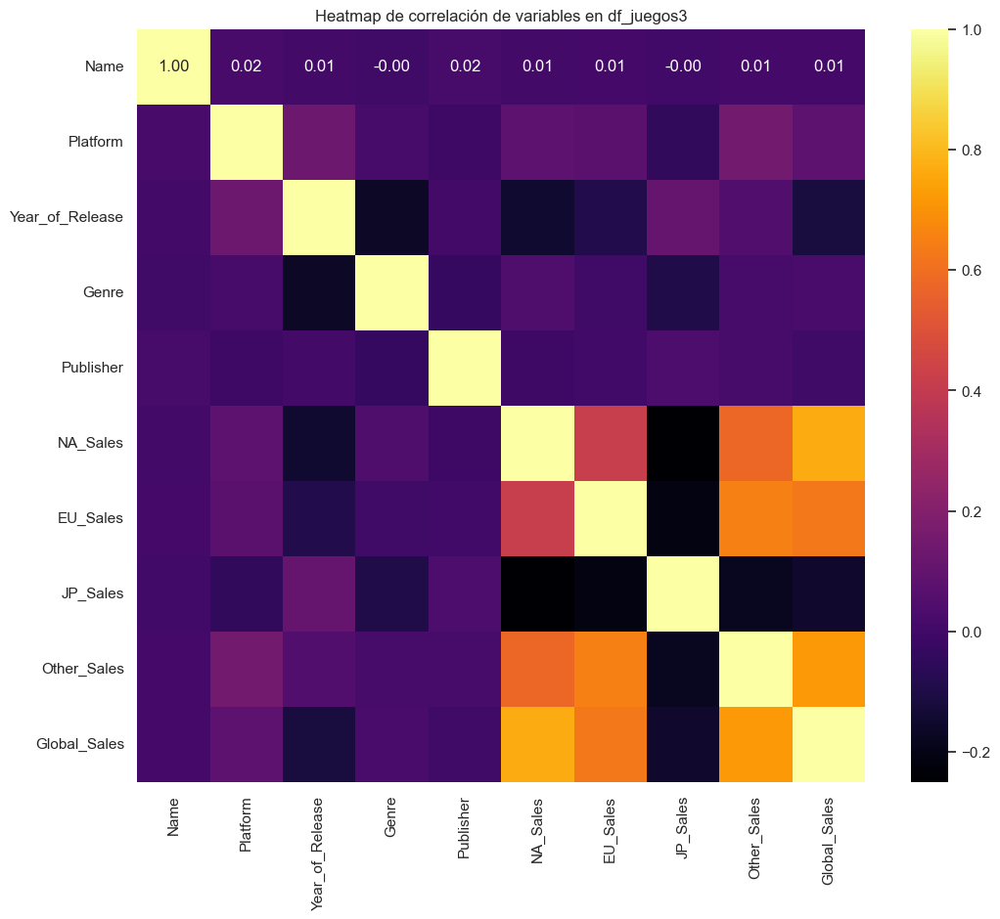

In [27]:
# Calcular la matriz de correlación
correlation_matrix = df_juegos3.corr()

# Crear el heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='inferno', fmt=".2f")
plt.title('Heatmap de correlación de variables en df_juegos3')
plt.show()

####  Se puede apreciar que la mayoría de variables correlacionan poco entre sí. En proporción hay muchas más correlaciones negativas que positivas, eso quiere decir que a medida que una variable crece la otra decrece, con un análisis detallado se podría saber el porqué de estos sucesos y tomar acciones para el desarrollo de la empresa. 

#### Creare nuevamente un reporte con dataprep para visualizar los datos tratados anteriormente.

In [28]:
perfil2 = ProfileReport(df_juegos3, title=" Nuevo Reporte de Juegos")

# Lo guardo en formato HTML
perfil2.to_file("reporte_juegos.html")

# Visualizacion 
perfil2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Podemos concretar que los datos están listos para los modelados de machine learning, ya que no contienen nulos, están encodeados, estandarizados y sin outliers.

# Entrenamiento de modelos 

#### Como se explico anteriormente, el primer objetivo es crear un algoritmo que pueda predecir las ventas globales de un juego basado en diferentes características.

In [29]:
#Primero realizare una regresion linear

X = df_juegos3.drop(columns=['Global_Sales'])  
y = df_juegos3['Global_Sales']  

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from scipy.stats import uniform

# Divido los datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
# Defino el espacio de búsqueda de hiperparámetros
param_dist = {'fit_intercept': [True, False]}  # Aquí puedes agregar más hiperparámetros a ajustar

# Inicialización del modelo
model = LinearRegression()

# Búsqueda de hiperparámetros
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, random_state=42)
random_search.fit(X_train, y_train)

# Mejores hiperparámetros encontrados
best_params = random_search.best_params_

In [31]:
# Entreno el modelo con los mejores hiperparámetros
best_model = LinearRegression(**best_params)
best_model.fit(X_train, y_train)

# Evaluación del modelo
score = best_model.score(X_test, y_test)
print("Score:", score)

Score: 0.7686167207062189


In [32]:
# El score dio 76%, voy a ver si aplicando otro algoritmo puedo hacer que esto mejore significativamente

In [33]:
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# División de datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [34]:
# Defino el espacio de búsqueda de hiperparámetros
param_dist = {
    'n_estimators': randint(10, 1000),  # Número de árboles en el bosque
    'max_features': ['auto', 'sqrt'],  # Número máximo de características a considerar en cada división
    'max_depth': [None, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],  # Profundidad máxima del árbol
    'min_samples_split': randint(2, 20),  # Número mínimo de muestras requeridas para dividir un nodo interno
    'min_samples_leaf': randint(1, 20),  # Número mínimo de muestras requeridas para estar en un nodo hoja
    'bootstrap': [True, False]  # Método de muestreo de observaciones
}

# Inicialización del modelo
model = RandomForestRegressor()

In [35]:
# Búsqueda de hiperparámetros
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, random_state=42)
random_search.fit(X_train, y_train)

# Mejores hiperparámetros encontrados
best_params = random_search.best_params_

# Entrenamiento del modelo con los mejores hiperparámetros
best_model = RandomForestRegressor(**best_params)
best_model.fit(X_train, y_train)

# Evaluación del modelo
score = best_model.score(X_test, y_test)
print("Score:", score)

Score: 0.8423543740274071


In [36]:
# El score mejoro significativamente,ahora voy a comparar los valores predichos con los actuales.
y_pred = best_model.predict(X_test)

# Creo un DataFrame para comparar los valores reales con los predichos
comparacion = pd.DataFrame({'Real': y_test, 'Predicho': y_pred})

# Mostrar los primeros registros del DataFrame
comparacion.head()

,Real,Predicho
4772,-0.1875,-0.174251
6628,1.1250,1.197643
13321,-0.1250,-0.085287
9084,0.4375,0.438650
7227,0.9375,0.871926


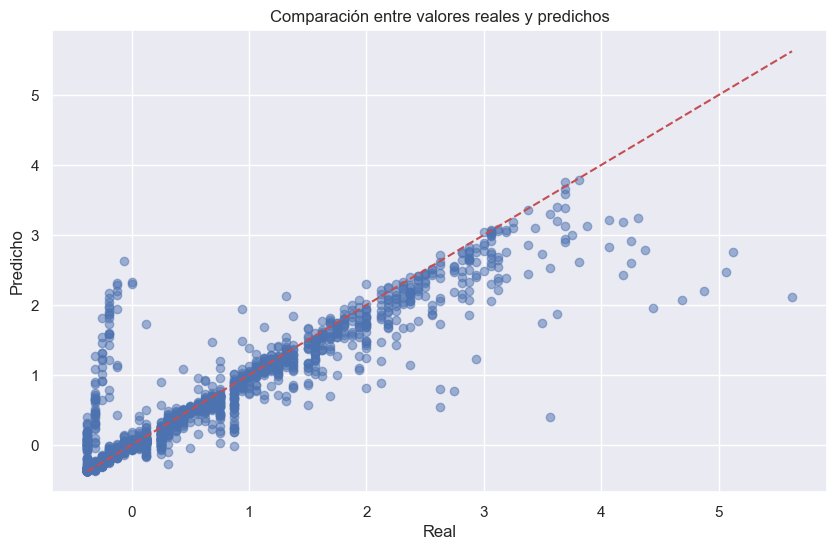

In [37]:
# Predicciones del modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Graficar los valores reales y predichos utilizando un scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, color='b')  # Real vs. Predicho
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='r')  # Línea de referencia
plt.xlabel('Real')
plt.ylabel('Predicho')
plt.title('Comparación entre valores reales y predichos')
plt.grid(True)
plt.show()

In [38]:
# por ultimo calculare las metricas del modelo

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Predicciones del modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Calcular el MSE y el MAE
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

# Calcular el R^2
r2 = r2_score(y_test, y_pred)

# Calcular el número de predictores
n = X_test.shape[1]

# Calcular el número de muestras
m = len(y_test)

# Calcular el R^2 ajustado
r2_adj = 1 - (1 - r2) * ((m - 1) / (m - n - 1))

# Imprimir los resultados
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("R^2:", r2)
print("Adjusted R^2:", r2_adj)

Mean Squared Error (MSE): 0.14714291748339647
Mean Absolute Error (MAE): 0.15847859145614046
R^2: 0.8423543740274071
Adjusted R^2: 0.8417358863928154


#### En comparacion al primer modelo, este dio un mejor resultado, dando un score del 84%, es decir que representa los datos en ese porcentaje.

#### El segundo objetivo es crear un algoritmo que identifique grupos de videojuegos con ventas similares.

#### Primero voy a agrupar las ventas en un nuevo dataset y a reducirles la dimensionalidad.

In [39]:
ventas = df_juegos3[['Global_Sales', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']]
ventas = ventas.reset_index(drop=True)
ventas.head()

,Global_Sales,NA_Sales,EU_Sales,JP_Sales,Other_Sales
0,1.0625,1.461538,0.0,0.0,-0.5
1,-0.3750,-0.307692,-0.2,1.0,-0.5
2,-0.3750,0.307692,1.6,2.0,-0.5
3,5.6250,2.230769,1.0,0.0,1.5
4,5.4375,0.230769,0.2,0.0,1.0


In [40]:
from sklearn.decomposition import PCA

# Aplico el PCA
pca = PCA(n_components=2)  # Especifica el número de componentes principales deseados
ventas_pca = pca.fit_transform(ventas)

# Creo un nuevo DataFrame con los componentes principales
ventas_pca_df = pd.DataFrame(data=ventas_pca, columns=['Componente Principal 1', 'Componente Principal 2'])

# Concateno el nuevo DataFrame con las columnas de ventas
ventas_pca_df = pd.concat([ventas_pca_df, ventas[['Global_Sales', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']]], axis=1)

ventas_pca_df.head()

,Componente Principal 1,Componente Principal 2,Global_Sales,NA_Sales,EU_Sales,JP_Sales,Other_Sales
0,-0.853682,-0.149117,1.0625,1.461538,0.0,0.0,-0.5
1,0.927725,-1.018223,-0.3750,-0.307692,-0.2,1.0,-0.5
2,1.063884,0.506235,-0.3750,0.307692,1.6,2.0,-0.5
3,-3.165512,3.652243,5.6250,2.230769,1.0,0.0,1.5
4,-2.231036,2.366656,5.4375,0.230769,0.2,0.0,1.0


#### Ahora comparare las ventas regionales con las ventas globales

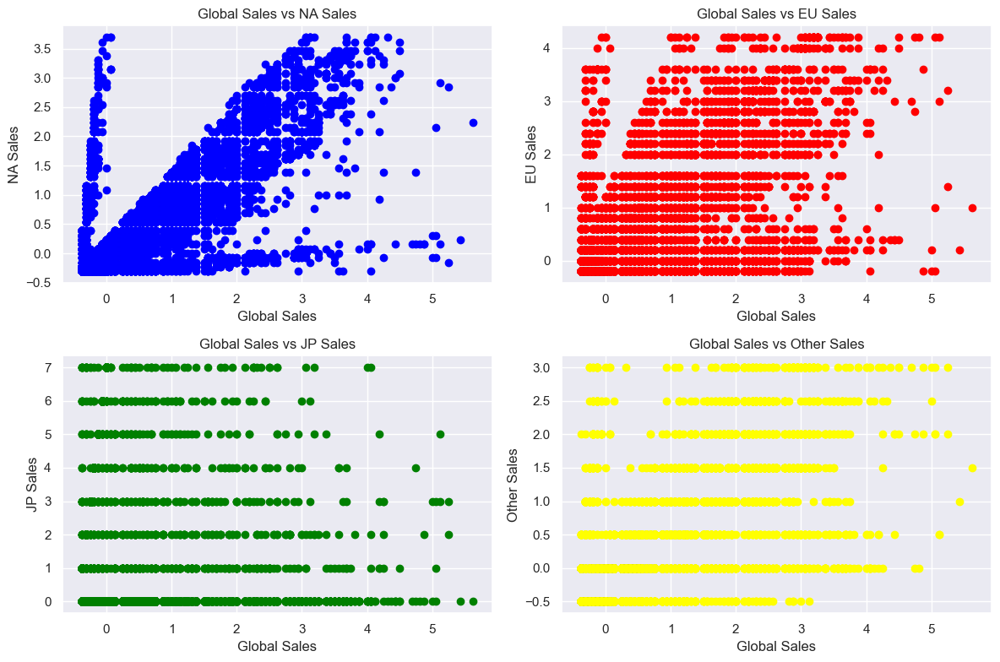

In [41]:
import matplotlib.pyplot as plt

# Graficos 
plt.figure(figsize=(12, 8))

# Gráfico de dispersión de Global Sales vs NA Sales
plt.subplot(2, 2, 1)
plt.scatter(ventas_pca_df['Global_Sales'], df_juegos3['NA_Sales'], color='blue')
plt.xlabel('Global Sales')
plt.ylabel('NA Sales')
plt.title('Global Sales vs NA Sales')

# Gráfico de dispersión de Global Sales vs EU Sales
plt.subplot(2, 2, 2)
plt.scatter(ventas_pca_df['Global_Sales'], df_juegos3['EU_Sales'], color='red')
plt.xlabel('Global Sales')
plt.ylabel('EU Sales')
plt.title('Global Sales vs EU Sales')

# Gráfico de dispersión de Global Sales vs JP Sales
plt.subplot(2, 2, 3)
plt.scatter(ventas_pca_df['Global_Sales'], df_juegos3['JP_Sales'], color='green')
plt.xlabel('Global Sales')
plt.ylabel('JP Sales')
plt.title('Global Sales vs JP Sales')

# Gráfico de dispersión de Global Sales vs Other Sales
plt.subplot(2, 2, 4)
plt.scatter(ventas_pca_df['Global_Sales'], df_juegos3['Other_Sales'], color='yellow')
plt.xlabel('Global Sales')
plt.ylabel('Other Sales')
plt.title('Global Sales vs Other Sales')

plt.tight_layout()
plt.show()

#### Aplicare un algoritmo de  k-means para ver las distribuciones

#### Como las ventas globales y las ventas en Norte América estan relacionadas y representan gran parte del mercado haré el análisis en base a estas.

In [42]:
df1 = ventas_pca_df[['Global_Sales','NA_Sales']]

In [45]:
X1 = df1

In [48]:
# diccionarios vacios para almacenar los resultados
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score,silhouette_score,silhouette_samples,calinski_harabasz_score
sse,db,slc,cal = {}, {}, {}, {}

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(X1) 
    if k == 3: labels = kmeans.labels_
    clusters = kmeans.labels_ # Extraccion de labels
    sse[k] = kmeans.inertia_ # Inercia: Suma de las distancias de las muestras a su centroide mas cercano
    db[k] = davies_bouldin_score(X1,clusters) # Calculo del indice de Davies Bouldin
    slc[k] = silhouette_score(X1,clusters) # Calculo del indice de Silhouette
    cal[k] = calinski_harabasz_score(X1,clusters) # Calculo del indice de Calinski-Harabasz

In [49]:
#variabilidad de acuerdo al numero de K
sse 

{2: 6507.908676549209,
 3: 4014.5157776814995,
 4: 3125.3142260845766,
 5: 2605.9969301049,
 6: 2147.0136854281964,
 7: 1814.7086124966477,
 8: 1582.313578792686,
 9: 1374.8706122185122}

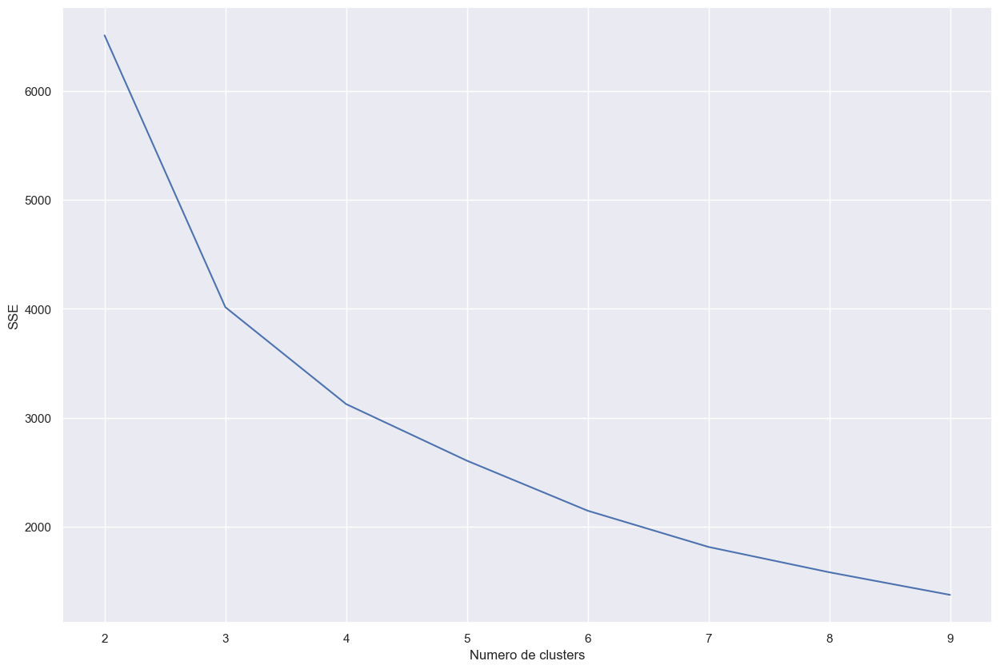

In [50]:
#metodo del codo
plt.figure(figsize=(15,10))
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Numero de clusters")
plt.ylabel("SSE")
plt.show()

In [51]:
# Mientras mas chico el score mejor
db

{2: 0.6304545017487142,
 3: 0.7240610842223857,
 4: 0.8549329638995304,
 5: 0.7911024234831369,
 6: 0.7293325653514596,
 7: 0.7545619166755847,
 8: 0.8288418933678529,
 9: 0.796916331404524}

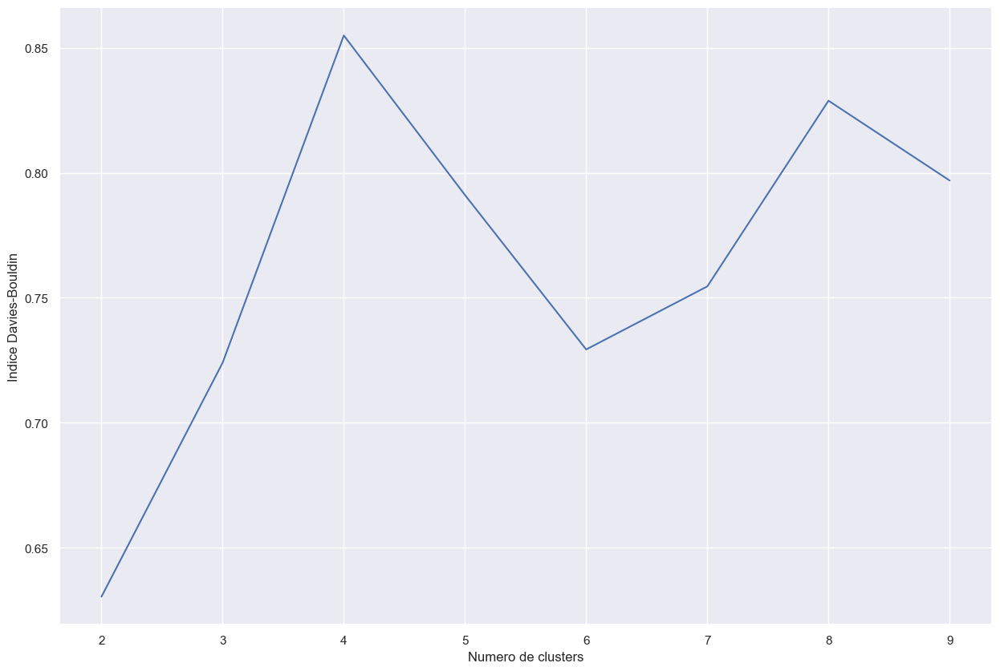

In [52]:
# Davies-Bouldin Index

plt.figure(figsize=(15,10))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("Numero de clusters")
plt.ylabel("Indice Davies-Bouldin")
plt.show()

In [53]:
slc

{2: 0.6520950362827882,
 3: 0.5755566990310319,
 4: 0.5143005102410386,
 5: 0.5223724313359683,
 6: 0.5393118117558922,
 7: 0.5046889610581706,
 8: 0.45751631464315057,
 9: 0.4659187052670821}

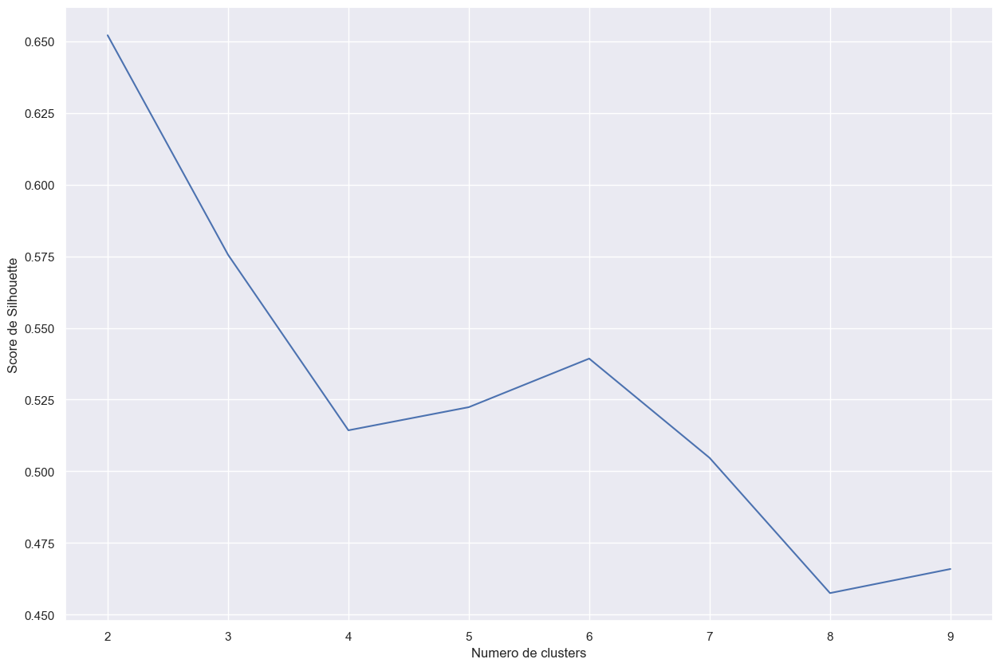

In [54]:
# Indice de Silhouette
plt.figure(figsize=(15,10))
plt.plot(list(slc.keys()), list(slc.values()))
plt.xlabel("Numero de clusters")
plt.ylabel("Score de Silhouette")
plt.show()

Para n_clusters = 2 El promedio del score de silhouette es: 0.6520950362827882
Para n_clusters = 3 El promedio del score de silhouette es: 0.5755566990310319
Para n_clusters = 4 El promedio del score de silhouette es: 0.5143005102410386
Para n_clusters = 5 El promedio del score de silhouette es: 0.5223724313359683
Para n_clusters = 6 El promedio del score de silhouette es: 0.5393118117558922
Para n_clusters = 7 El promedio del score de silhouette es: 0.5046889610581706
Para n_clusters = 8 El promedio del score de silhouette es: 0.45751631464315057
Para n_clusters = 9 El promedio del score de silhouette es: 0.4659187052670821


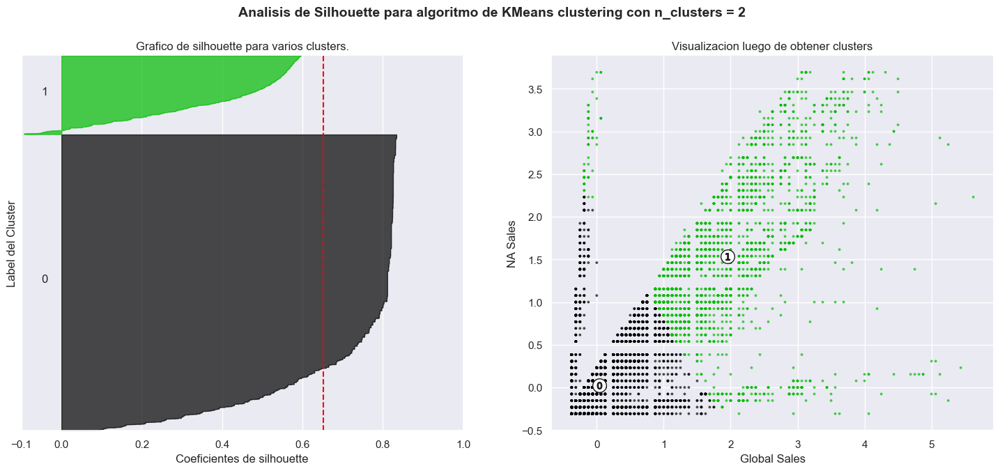

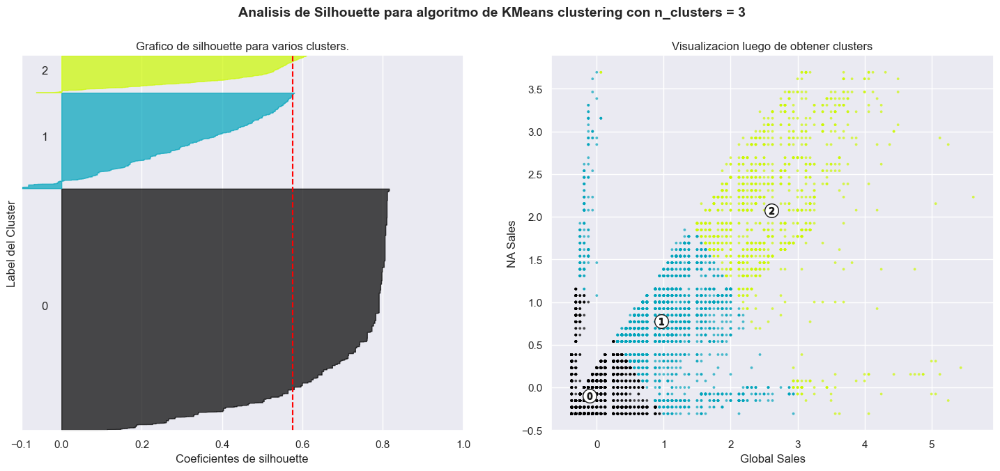

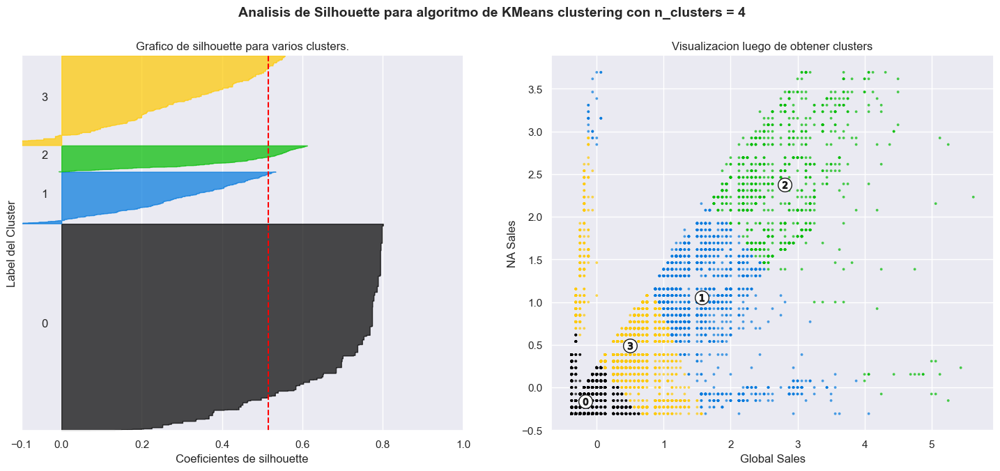

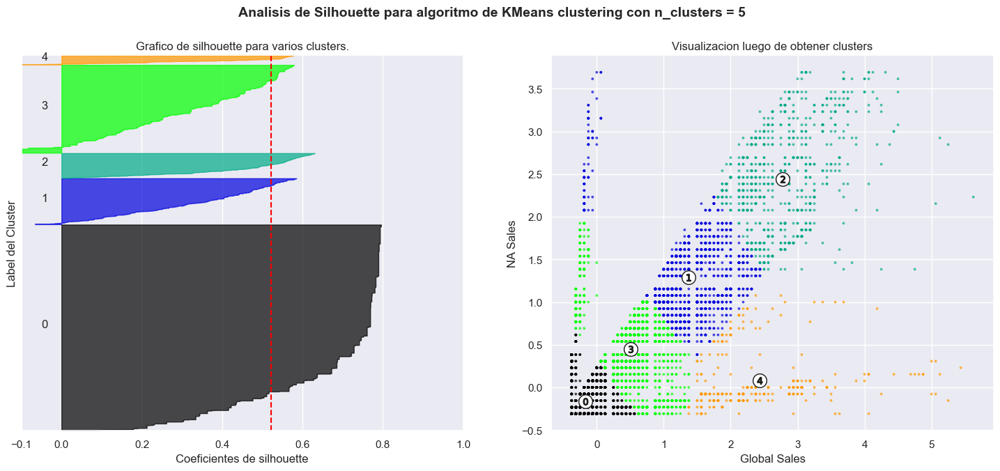

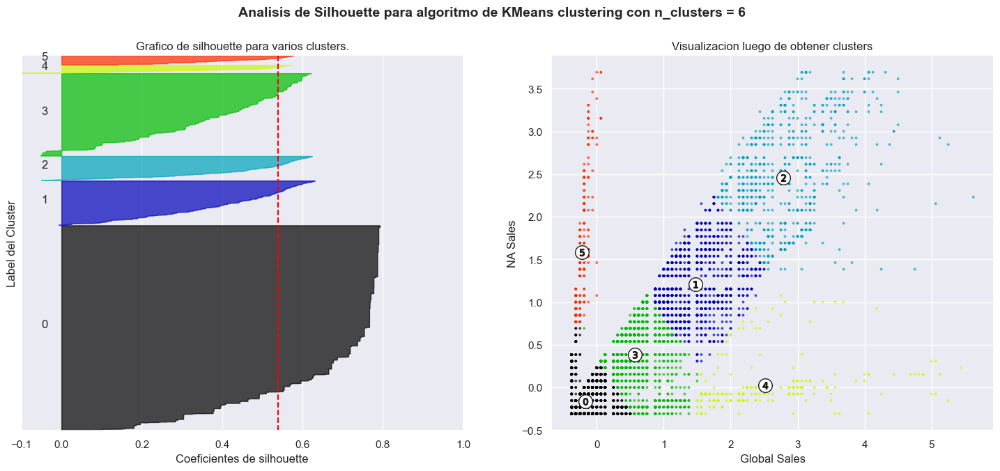

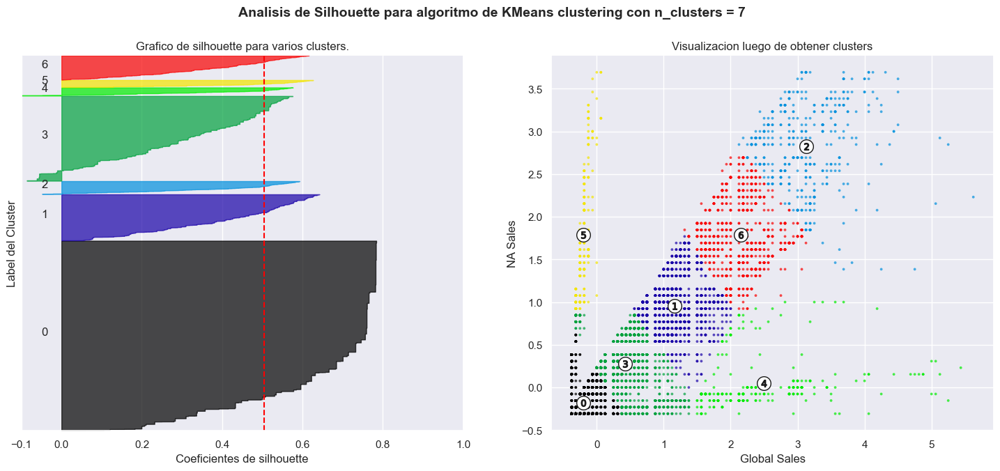

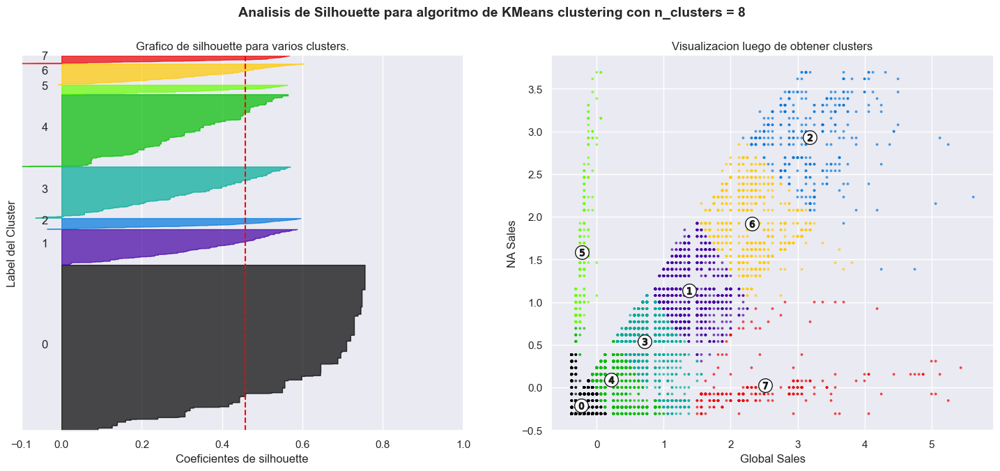

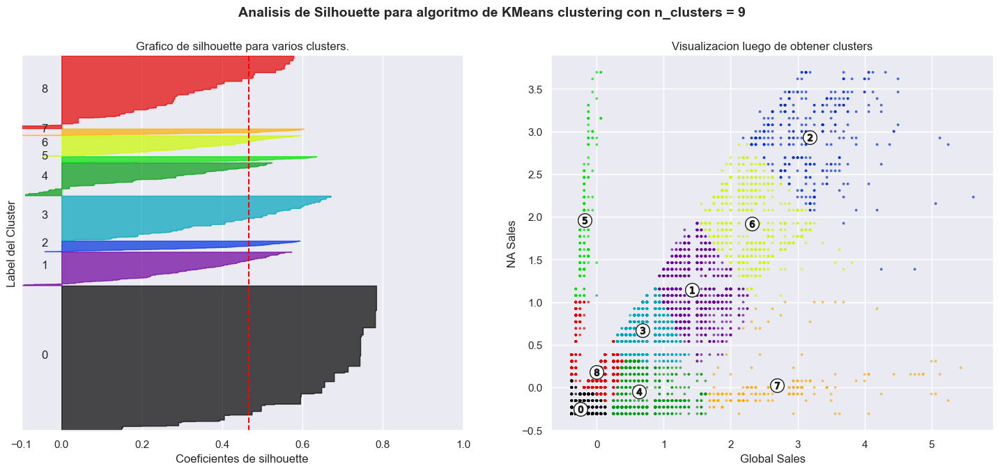

In [55]:
from matplotlib import cm
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import numpy as np

X1 = ventas_pca_df[['Global_Sales', 'NA_Sales']]

for n_clusters in range(2, 10):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X1) + (n_clusters + 1) * 10])
    
    clusterer = KMeans(n_clusters=n_clusters, max_iter=1000, random_state=10)
    cluster_labels = clusterer.fit_predict(X1)
    
    silhouette_avg = silhouette_score(X1, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El promedio del score de silhouette es:", silhouette_avg)
    
    sample_silhouette_values = silhouette_samples(X1, cluster_labels)
    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
    
    ax1.set_title("Grafico de silhouette para varios clusters.")
    ax1.set_xlabel("Coeficientes de silhouette")
    ax1.set_ylabel("Label del Cluster")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X1['Global_Sales'], X1['NA_Sales'], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')
    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o', c="white", alpha=1, s=200, edgecolor='k')
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

    ax2.set_title("Visualizacion luego de obtener clusters")
    ax2.set_xlabel("Global Sales")
    ax2.set_ylabel("NA Sales")

    plt.suptitle(("Analisis de Silhouette para algoritmo de KMeans clustering "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

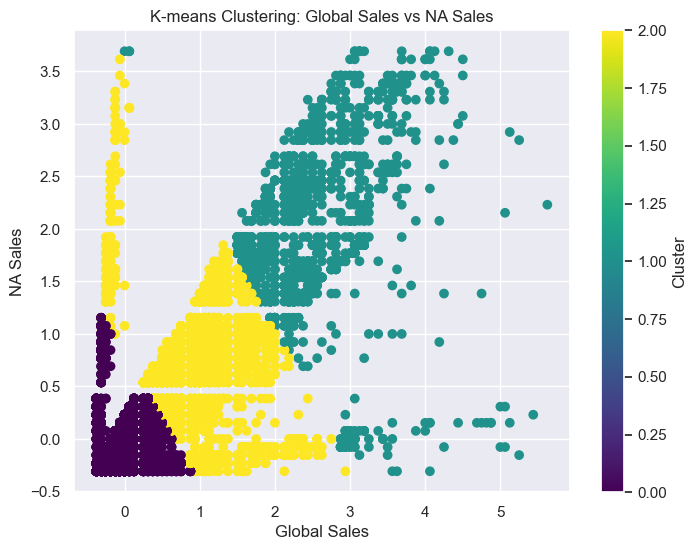

In [59]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

graf1 = ventas_pca_df[['Global_Sales', 'NA_Sales']]

# Define el número de clusters
num_clusters = 3

# Ajustar el modelo KMeans
kmeans_model = KMeans(n_clusters=num_clusters)
kmeans_model.fit(graf1)

# Obtener las etiquetas de los clusters
labels = kmeans_model.labels_

# Graficar los puntos con los clusters
plt.figure(figsize=(8, 6))
plt.scatter(graf1['Global_Sales'], graf1['NA_Sales'], c=labels, cmap='viridis')
plt.xlabel('Global Sales')
plt.ylabel('NA Sales')
plt.title('K-means Clustering: Global Sales vs NA Sales')
plt.colorbar(label='Cluster')
plt.show()

#### EL número de clusters resultó ser acertado, con k-means, ahora probemos con DBSCAN

Mejores hiperparámetros: {'min_samples': 1, 'eps': 0.30000000000000004}


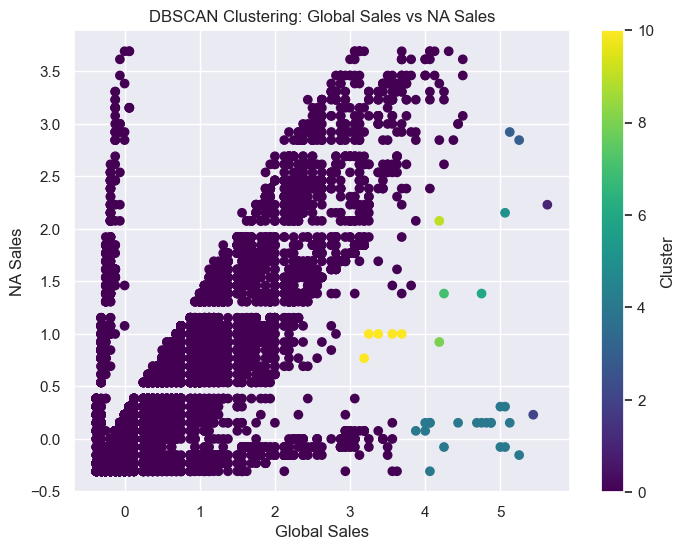

In [61]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Defino el espacio de búsqueda de hiperparámetros
param_grid = {
    'eps': np.linspace(0.1, 1.0, 10),  # Vary eps from 0.1 to 1.0
    'min_samples': range(1, 10)  # Vary min_samples from 1 to 10
}

dbscan_model = DBSCAN()

# Defino la función de puntuación utilizando el score de silhouette
def custom_silhouette_scorer(estimator, X1):
    clusters = estimator.fit_predict(X1)
    silhouette_avg = silhouette_score(X1, clusters)
    return silhouette_avg

# Realizo la búsqueda aleatoria de hiperparámetros
random_search = RandomizedSearchCV(estimator=dbscan_model, param_distributions=param_grid, n_iter=20, cv=5, scoring=custom_silhouette_scorer)
random_search.fit(X1)

# Mejores hiperparámetros encontrados
best_params = random_search.best_params_
print("Mejores hiperparámetros:", best_params)

# Aplico el modelo con los mejores hiperparámetros encontrados
best_dbscan_model = DBSCAN(**best_params)
clusters = best_dbscan_model.fit_predict(X1)

plt.figure(figsize=(8, 6))
plt.scatter(X1['Global_Sales'], X1['NA_Sales'], c=clusters, cmap='viridis')
plt.xlabel('Global Sales')
plt.ylabel('NA Sales')
plt.title('DBSCAN Clustering: Global Sales vs NA Sales')
plt.colorbar(label='Cluster')
plt.show()

#### El primer modelo dió un mejor resultado

# Conclusiónes
### Primer algoritmo:  El score explica aproximadamente el 84.3% de la variabilidad en los datos de salida utilizando las características proporcionadas. Esto sugiere que el modelo tiene un buen ajuste y puede capturar la relación entre las variables de entrada y de salida de manera significativa. El MSE es relativamente bajo, lo que indica que las predicciones del modelo tienen errores cuadráticos medios pequeños en comparación con la varianza total en los datos de salida. Esto sugiere que el modelo tiene una precisión razonable en la predicción de los valores de salida. El MAE también es bajo, lo que indica que las predicciones del modelo tienen desviaciones medias pequeñas de los valores reales. Esto refuerza la idea de que el modelo tiene una precisión aceptable en sus predicciones. Por último, el R cuadrado y el R cuadrado ajustado son bastante similares, lo que sugiere que el ajuste del modelo no está siendo penalizado significativamente por el número de características incluidas. Esto indica que el modelo no está haciendo overfiting y que la inclusión de las características actuales en el modelo es razonable.
### Segundo algoritmo: El primer algoritmo k-means, performo mejor que el dbscan debido a que se puede examinar visualmente cómo se agrupan los datos y qué tan separados están los clusters entre sí. Esto puede proporcionar información sobre la distribución de las ventas y posiblemente identificar patrones o segmentos de mercado, además la visualización permite evaluar rápidamente la calidad del agrupamiento y si los clusters parecen significativos o no.